In [1]:
from google.colab import drive
drive.mount('/content/drive')
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
drive  model.png  sample_data


In [2]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

In [3]:
CSV_HEADER = ['label', 'I1', 'I2', 'I3', 'I4', 'I5', 'I6', 'I7', 'I8', 'I9', 'I10', 'I11',
      'I12', 'I13', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
      'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22',
      'C23', 'C24', 'C25', 'C26']

In [4]:
file = '/content/drive/MyDrive/ColabNotebooks/RS/wide_deep_model/data/dac_sample.txt'
df = pd.read_csv(file, sep='\t', header=None, names=CSV_HEADER)

In [5]:
train_data, test_data = train_test_split(df, test_size=0.3)

In [6]:
train_data.head()

,label,I1,I2,I3,I4,I5,I6,I7,I8,I9,I10,I11,I12,I13,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,C15,C16,C17,C18,C19,C20,C21,C22,C23,C24,C25,C26
46573,1,NaN,-1,15.0,5.0,14268.0,69.0,7.0,7.0,156.0,NaN,2.0,0.0,6.0,439a44a4,09e68b86,cd9dbee4,a7970f22,25c83c98,NaN,71c23d74,0b153874,a73ee510,c6c8dd7c,ae4c531b,e1b40567,01c2bbc7,07d13a8f,36721ddc,b0b60d11,e5ba7672,5aed7436,2b558521,b1252a9d,fbe278c3,NaN,32c7478e,3fdb382b,9d93af03,49d68486
40496,0,NaN,0,5.0,6.0,4412.0,172.0,1.0,5.0,56.0,NaN,1.0,NaN,6.0,05db9164,4f25e98b,8c57357d,5a2b1097,f3474129,7e0ccccf,52283d1c,0b153874,a73ee510,03e48276,e51ddf94,8988b189,3516f6e6,b28479f6,df2f73e9,a8f08695,d4bb7bd8,bc5a0ff7,356fbf2d,b1252a9d,b4551619,NaN,3a171ecb,ddc4fca0,001f3601,3279611b
95822,0,1.0,13,33.0,6.0,388.0,24.0,7.0,26.0,24.0,1.0,2.0,NaN,24.0,05db9164,9e5ce894,b5770359,13508380,4cf72387,fe6b92e5,969b8e03,0b153874,a73ee510,aa6da1ef,5b906b78,943da559,c95c9034,07d13a8f,8cf98699,e2c95845,e5ba7672,a5bb7b8a,55dd3565,b1252a9d,dcca9e68,NaN,423fab69,45ab94c8,ea9a246c,c84c4aec
30901,1,4.0,1,36.0,17.0,743.0,122.0,6.0,46.0,69.0,1.0,3.0,NaN,17.0,05db9164,80e26c9b,4a0fa68d,d026a6f8,25c83c98,fbad5c96,968a6688,0b153874,a73ee510,7259dc52,f25fe7e9,3c82c185,dd183b4c,07d13a8f,f3635baf,47458200,e5ba7672,f54016b9,21ddcdc9,b1252a9d,4963a8b5,NaN,32c7478e,1793a828,e8b83407,032c89fa
61497,1,NaN,0,5.0,4.0,18953.0,164.0,4.0,5.0,162.0,NaN,2.0,0.0,4.0,05db9164,90081f33,c8fbe6f4,9ff76ed7,25c83c98,13718bbd,d9459b41,5b392875,a73ee510,2351a767,14515151,129a3ed4,2342c398,64c94865,1ce3ecc3,e00649f9,3486227d,0ebdbf46,NaN,NaN,4aaf0037,NaN,423fab69,8e84e831,NaN,NaN


In [7]:
train_data_file = "/content/drive/MyDrive/ColabNotebooks/RS/wide_deep_model/data/train_data.csv"
test_data_file = "/content/drive/MyDrive/ColabNotebooks/RS/wide_deep_model/data/test_data.csv"

train_data.to_csv(train_data_file, index=False)
test_data.to_csv(test_data_file, index=False)

In [8]:
TARGET_FEATURE_NAME = "label"

TARGET_FEATURE_LABELS = ["0", "1"]

NUMERIC_FEATURE_NAMES = ['I1', 'I2', 'I3', 'I4', 'I5', 'I6', 'I7', 
             'I8', 'I9', 'I10', 'I11','I12', 'I13']

CATEGORICAL_FEATURE_NAMES = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
      'C12', 'C13', 'C14', 'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21', 'C22',
      'C23', 'C24', 'C25', 'C26']
# 类别特征字典
CATEGORICAL_FEATURES_WITH_VOCABULARY = {
    str(cate) : [str(elem) for elem in df[cate].unique()] for cate in CATEGORICAL_FEATURE_NAMES
    }

CATEGORICAL_FEATURE_NAMES = list(CATEGORICAL_FEATURES_WITH_VOCABULARY.keys())

FEATURE_NAMES = NUMERIC_FEATURE_NAMES + CATEGORICAL_FEATURE_NAMES

COLUMN_DEFAULTS = [
    [0.] if feature_name in NUMERIC_FEATURE_NAMES + [TARGET_FEATURE_NAME] else ["NA"]
    for feature_name in CSV_HEADER
]

NUM_CLASSES = len(TARGET_FEATURE_LABELS)

In [9]:
def get_dataset_from_csv(csv_file_path, batch_size, shuffle=False):

    dataset = tf.data.experimental.make_csv_dataset(
        csv_file_path,
        batch_size=batch_size,
        column_names=CSV_HEADER,
        column_defaults=COLUMN_DEFAULTS,
        label_name=TARGET_FEATURE_NAME,
        num_epochs=1,
        header=True,
        shuffle=shuffle,
    )
    return dataset.cache()

In [10]:
learning_rate = 0.001
dropout_rate = 0.1
batch_size = 256
num_epochs = 10

hidden_units = [64, 32]

In [11]:
train_dataset = get_dataset_from_csv(train_data_file, batch_size, shuffle=True)

In [12]:
train_dataset.take(1)

<TakeDataset shapes: (OrderedDict([(I1, (None,)), (I2, (None,)), (I3, (None,)), (I4, (None,)), (I5, (None,)), (I6, (None,)), (I7, (None,)), (I8, (None,)), (I9, (None,)), (I10, (None,)), (I11, (None,)), (I12, (None,)), (I13, (None,)), (C1, (None,)), (C2, (None,)), (C3, (None,)), (C4, (None,)), (C5, (None,)), (C6, (None,)), (C7, (None,)), (C8, (None,)), (C9, (None,)), (C10, (None,)), (C11, (None,)), (C12, (None,)), (C13, (None,)), (C14, (None,)), (C15, (None,)), (C16, (None,)), (C17, (None,)), (C18, (None,)), (C19, (None,)), (C20, (None,)), (C21, (None,)), (C22, (None,)), (C23, (None,)), (C24, (None,)), (C25, (None,)), (C26, (None,))]), (None,)), types: (OrderedDict([(I1, tf.float32), (I2, tf.float32), (I3, tf.float32), (I4, tf.float32), (I5, tf.float32), (I6, tf.float32), (I7, tf.float32), (I8, tf.float32), (I9, tf.float32), (I10, tf.float32), (I11, tf.float32), (I12, tf.float32), (I13, tf.float32), (C1, tf.string), (C2, tf.string), (C3, tf.string), (C4, tf.string), (C5, tf.string), (C6

In [13]:
examples, labels = next(iter(train_dataset)) # Just the first batch.
print("EXAMPLES: \n", examples, "\n")
print("LABELS: \n", labels)

EXAMPLES: 
 OrderedDict([('I1', <tf.Tensor: shape=(256,), dtype=float32, numpy=
array([ 0.,  2.,  2., 26.,  0.,  0.,  0.,  1.,  0.,  0.,  9.,  2.,  0.,
        1.,  0.,  2.,  0.,  0.,  0.,  2.,  1.,  1.,  7.,  0.,  0.,  0.,
        0.,  0.,  0.,  2.,  0.,  0.,  0.,  0., 48.,  0.,  4.,  0.,  0.,
        2.,  0.,  5.,  0.,  0.,  1.,  0., 11.,  0.,  0.,  0.,  0., 10.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
       11., 12.,  1.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,  3.,  0.,
        0.,  0.,  0.,  0.,  1.,  0.,  0., 27., 14.,  0.,  0.,  2.,  0.,
        0.,  0., 22.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
        0.,  1.,  4.,  0.,  0.,  1.,  0.,  0.,  0.,  1.,  0.,  1.,  0.,
        0.,  7.,  0.,  0.,  1.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,
        0.,  0.,  0.,  0.,  0.,  0.,  3.,  0.,  0.,  0.,  0.,  2.,  0.,
        3.,  0., 11.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,  0.,  0.,  0.,
        0.,  2.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,

In [14]:
def run_experiment(model):

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss=keras.losses.SparseCategoricalCrossentropy(),
        metrics=[keras.metrics.SparseCategoricalAccuracy()],
    )

    train_dataset = get_dataset_from_csv(train_data_file, batch_size, shuffle=True)

    test_dataset = get_dataset_from_csv(test_data_file, batch_size)

    print("Start training the model...")
    history = model.fit(train_dataset, epochs=num_epochs)
    print("Model training finished")

    _, accuracy = model.evaluate(test_dataset, verbose=0)

    print(f"Test accuracy: {round(accuracy * 100, 2)}%")


## Create model inputs

Now, define the inputs for the models as a dictionary, where the key is the feature name,
and the value is a `keras.layers.Input` tensor with the corresponding feature shape
and data type.

In [15]:
def create_model_inputs():
    inputs = {}
    for feature_name in FEATURE_NAMES:
        if feature_name in NUMERIC_FEATURE_NAMES:
            inputs[feature_name] = layers.Input(
                name=feature_name, shape=(), dtype=tf.float32
            )
        else:
            inputs[feature_name] = layers.Input(
                name=feature_name, shape=(), dtype=tf.string
            )
    return inputs

## Encode features

We create two representations of our input features: sparse and dense:
1. In the **sparse** representation, the categorical features are encoded with one-hot
encoding using the `CategoryEncoding` layer. This representation can be useful for the
model to *memorize* particular feature values to make certain predictions.
2. In the **dense** representation, the categorical features are encoded with
low-dimensional embeddings using the `Embedding` layer. This representation helps
the model to *generalize* well to unseen feature combinations.

In [16]:
from tensorflow.keras.layers.experimental import preprocessing

def encode_inputs(inputs, use_embedding=False):
    encoded_features = []
    for feature_name in inputs:
        # 分别处理类别特征和数值特征
        if feature_name in CATEGORICAL_FEATURE_NAMES:
            vocabulary = CATEGORICAL_FEATURES_WITH_VOCABULARY[feature_name]
            # Create a lookup to convert string values to an integer indices. 编码字符类型
            # Since we are not using a mask token nor expecting any out of vocabulary
            # (oov) token, we set mask_token to None and  num_oov_indices to 0.
            lookup = preprocessing.StringLookup(
                vocabulary=vocabulary,
                mask_token=None,
                num_oov_indices=1,
                output_mode="int" if use_embedding else "binary", # binary使用one-hot编码
            )
            if use_embedding:
                # Convert the string input values into integer indices.
                encoded_feature = lookup(inputs[feature_name])
                # embedding_dims = int(math.sqrt(len(vocabulary)))
                embedding_dims = 4
                # Create an embedding layer with the specified dimensions.
                embedding = layers.Embedding(
                    input_dim=len(vocabulary) + 1, output_dim = embedding_dims
                )
                # Convert the index values to embedding representations.
                encoded_feature = embedding(encoded_feature)
            else:
                # Convert the string input values into a one hot encoding.
                encoded_feature = lookup(tf.expand_dims(inputs[feature_name], -1))
        else:
            # Use the numerical features as-is.
            encoded_feature = tf.expand_dims(inputs[feature_name], -1)

        encoded_features.append(encoded_feature)

    all_features = layers.concatenate(encoded_features)
    return all_features


## Experiment 1: a baseline model

In the first experiment, let's create a multi-layer feed-forward network,
where the categorical features are one-hot encoded.

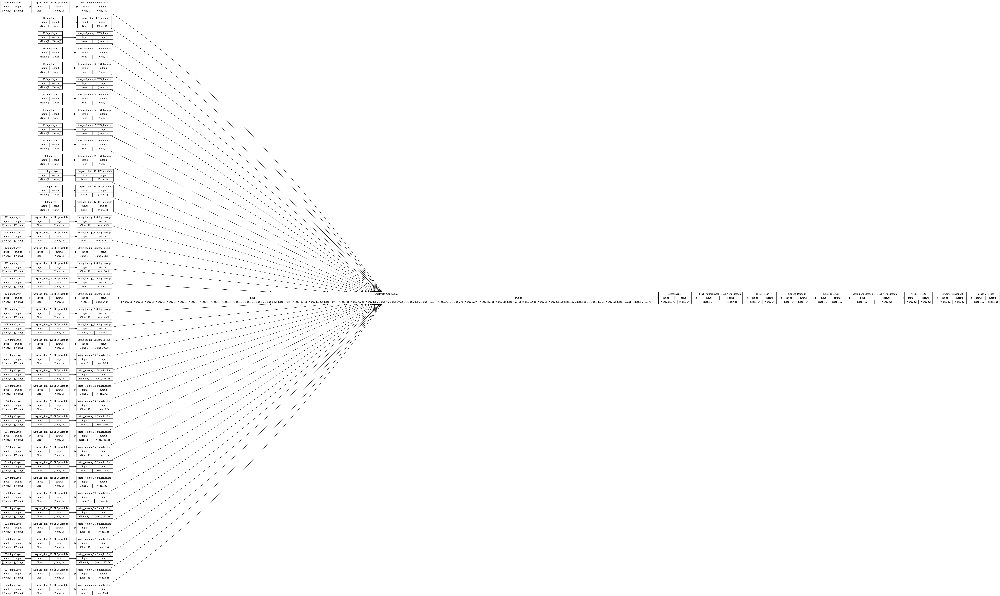

In [17]:
def create_baseline_model():
    inputs = create_model_inputs()
    features = encode_inputs(inputs)

    for units in hidden_units:
        features = layers.Dense(units)(features)
        features = layers.BatchNormalization()(features)
        features = layers.ReLU()(features)
        features = layers.Dropout(dropout_rate)(features)

    outputs = layers.Dense(units=NUM_CLASSES, activation="softmax")(features)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model


baseline_model = create_baseline_model()
keras.utils.plot_model(baseline_model, show_shapes=True, rankdir="LR")

In [22]:
run_experiment(baseline_model)

Start training the model...
Epoch 1/10
274/274 [==============================] - 9s 25ms/step - loss: 0.5540 - sparse_categorical_accuracy: 0.7561
Epoch 2/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5207 - sparse_categorical_accuracy: 0.7723
Epoch 3/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5170 - sparse_categorical_accuracy: 0.7719
Epoch 4/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5094 - sparse_categorical_accuracy: 0.7729
Epoch 5/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5162 - sparse_categorical_accuracy: 0.7727
Epoch 6/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5115 - sparse_categorical_accuracy: 0.7729
Epoch 7/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5140 - sparse_categorical_accuracy: 0.7727
Epoch 8/10
274/274 [==============================] - 5s 18ms/step - loss: 0.5044 - sparse_categorical_accuracy: 0.7735
Epoch 9/10
2

## Experiment 2: Wide & Deep model

In the second experiment, we create a Wide & Deep model. The wide part of the model
a linear model, while the deep part of the model is a multi-layer feed-forward network.

Use the sparse representation of the input features in the wide part of the model and the
dense representation of the input features for the deep part of the model.

Note that every input features contributes to both parts of the model with different
representations.

In [18]:

def create_wide_and_deep_model():

    inputs = create_model_inputs()
    wide = encode_inputs(inputs) # 线性部分，类别特征one_hot编码
    wide = layers.BatchNormalization()(wide)

    deep = encode_inputs(inputs, use_embedding=True) # 深度部分
    for units in hidden_units:
        deep = layers.Dense(units)(deep)
        deep = layers.BatchNormalization()(deep)
        deep = layers.ReLU()(deep)
        deep = layers.Dropout(dropout_rate)(deep)

    merged = layers.concatenate([wide, deep])
    outputs = layers.Dense(units=NUM_CLASSES, activation="softmax")(merged)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model


wide_and_deep_model = create_wide_and_deep_model()
keras.utils.plot_model(wide_and_deep_model, show_shapes=True, rankdir="LR")

In [19]:
run_experiment(wide_and_deep_model)

Start training the model...
Epoch 1/10
274/274 [==============================] - 23s 56ms/step - loss: 0.5135 - sparse_categorical_accuracy: 0.7734
Epoch 2/10
274/274 [==============================] - 12s 45ms/step - loss: 0.3254 - sparse_categorical_accuracy: 0.8644
Epoch 3/10
274/274 [==============================] - 12s 44ms/step - loss: 0.2807 - sparse_categorical_accuracy: 0.8865
Epoch 4/10
274/274 [==============================] - 12s 44ms/step - loss: 0.2846 - sparse_categorical_accuracy: 0.8877
Epoch 5/10
274/274 [==============================] - 12s 44ms/step - loss: 0.2626 - sparse_categorical_accuracy: 0.8982
Epoch 6/10
274/274 [==============================] - 12s 44ms/step - loss: 0.2616 - sparse_categorical_accuracy: 0.8975
Epoch 7/10
274/274 [==============================] - 12s 44ms/step - loss: 0.2645 - sparse_categorical_accuracy: 0.8995
Epoch 8/10
274/274 [==============================] - 12s 44ms/step - loss: 0.2617 - sparse_categorical_accuracy: 0.8999
Epoc

## Experiment 3: Deep & Cross model

In the third experiment, we create a Deep & Cross model. The deep part of this model
is the same as the deep part created in the previous experiment. The key idea of
the cross part is to apply explicit feature crossing in an efficient way,
where the degree of cross features grows with layer depth.

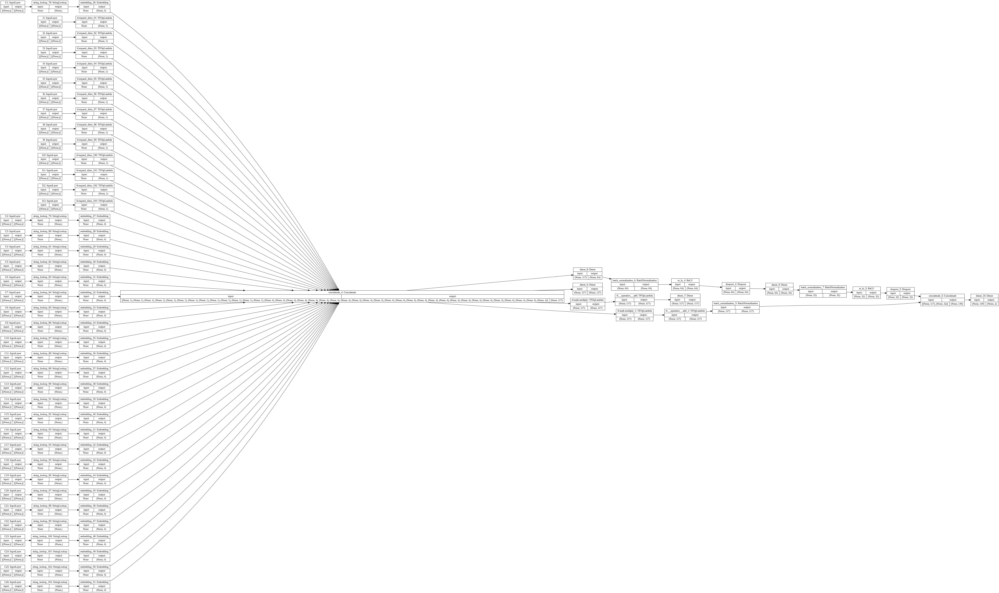

In [20]:
def create_deep_and_cross_model():

    inputs = create_model_inputs()
    x0 = encode_inputs(inputs, use_embedding=True)

    cross = x0
    for _ in hidden_units:
        units = cross.shape[-1]
        x = layers.Dense(units)(cross)
        cross = x0 * x + cross
    cross = layers.BatchNormalization()(cross)

    deep = x0
    for units in hidden_units:
        deep = layers.Dense(units)(deep)
        deep = layers.BatchNormalization()(deep)
        deep = layers.ReLU()(deep)
        deep = layers.Dropout(dropout_rate)(deep)

    merged = layers.concatenate([cross, deep])
    outputs = layers.Dense(units=NUM_CLASSES, activation="softmax")(merged)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model


deep_and_cross_model = create_deep_and_cross_model()
keras.utils.plot_model(deep_and_cross_model, show_shapes=True, rankdir="LR")

In [21]:
run_experiment(deep_and_cross_model)

Start training the model...
Epoch 1/10
274/274 [==============================] - 14s 33ms/step - loss: 0.5634 - sparse_categorical_accuracy: 0.7616
Epoch 2/10
274/274 [==============================] - 6s 23ms/step - loss: 0.5120 - sparse_categorical_accuracy: 0.7733
Epoch 3/10
274/274 [==============================] - 6s 24ms/step - loss: 0.4974 - sparse_categorical_accuracy: 0.7762
Epoch 4/10
274/274 [==============================] - 7s 24ms/step - loss: 0.4491 - sparse_categorical_accuracy: 0.7945
Epoch 5/10
274/274 [==============================] - 6s 23ms/step - loss: 0.4119 - sparse_categorical_accuracy: 0.8114
Epoch 6/10
274/274 [==============================] - 7s 24ms/step - loss: 0.3463 - sparse_categorical_accuracy: 0.8472
Epoch 7/10
274/274 [==============================] - 7s 24ms/step - loss: 0.3006 - sparse_categorical_accuracy: 0.8706
Epoch 8/10
274/274 [==============================] - 6s 23ms/step - loss: 0.2689 - sparse_categorical_accuracy: 0.8866
Epoch 9/10
